# Churn Prediction

### Data Dictionary

- **state**: state
- **account length**: account length (number of days account has been active)
- **area code**: area code 
- **phone number**: phone number
- **international plan**: international plan (yes/no)
- **voice mail plan**: voice mail plan(yes/no)
- **number vmail messages**: number of voice mail messages
- **total day minutes**: day = along the day which is from 8:00 am to 6:00 pm 
- **total day calls**: total day calls
- **total day charge**: total day charge
- **total eve minutes**: total evening minutes
- **total eve calls**: total evening calls
- **total eve charge**: total evening charge
- **total night minutes**: total night minutes
- **total night calls**: total night calls
- **total night charge**: total night charge
- **total intl minutes**: total international minutes
- **total intl calls**: total international calls
- **total intl charge**: total international charge
- **number customer service calls**: number of customer service calls
- **Churn Flag**: True or Flase (Target Variable)

In [1]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import pandas_profiling

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)
# setting the precision of floating numbers to 5 decimal points
pd.set_option("display.float_format", lambda x: "%.5f" % x)

# Library to split data
import sklearn
from sklearn.model_selection import train_test_split

#  For preprocessing
from sklearn.preprocessing import (
    LabelEncoder,
    RobustScaler,
)
from mlxtend.preprocessing import minmax_scaling

# To build models for prediction
import statsmodels.stats.api
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Classifiers
from sklearn.ensemble import (
    RandomForestClassifier,
    AdaBoostClassifier,
    StackingClassifier,
)
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

import lightgbm as lgb
from lightgbm import LGBMClassifier
import optuna

from sklearn.linear_model import LogisticRegression

# To select models
from sklearn import model_selection
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


# To select features
from sklearn.feature_selection import SelectKBest, chi2

# To tune different models
from sklearn.model_selection import GridSearchCV

# Libraries to get different metric scores
from sklearn import metrics
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    plot_confusion_matrix,
    precision_recall_curve,
    classification_report,
    make_scorer,
)
import warnings

warnings.filterwarnings("ignore")

In [2]:
# Importing data
data = pd.read_csv("churn.csv")

In [3]:
df = data.copy()

In [4]:
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,number customer service calls,Churn Flag
0,KS,128,415,382-4657,no,yes,25,265.10000,110,45.07000,197.40000,99,16.78000,244.70000,91,11.01000,10.00000,3,2.70000,1,False
1,OH,107,415,371-7191,no,yes,26,161.60000,123,27.47000,195.50000,103,16.62000,254.40000,103,11.45000,13.70000,3,3.70000,1,False
2,NJ,137,415,358-1921,no,no,0,243.40000,114,41.38000,121.20000,110,10.30000,162.60000,104,7.32000,12.20000,5,3.29000,0,False
3,OH,84,408,375-9999,yes,no,0,299.40000,71,50.90000,61.90000,88,5.26000,196.90000,89,8.86000,6.60000,7,1.78000,2,False
4,OK,75,415,330-6626,yes,no,0,166.70000,113,28.34000,148.30000,122,12.61000,186.90000,121,8.41000,10.10000,3,2.73000,3,False


#### Removing Whitespaces
There are whitespaces in column names, we will be removing them

In [5]:
# remove trailing whitespaces
df.columns = df.columns.str.rstrip()

In [6]:
# stripping whitespaces in target column
df["Churn Flag"] = [x.strip(" ") for x in df["Churn Flag"]]

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          5000 non-null   object 
 1   account length                 5000 non-null   int64  
 2   area code                      5000 non-null   int64  
 3   phone number                   5000 non-null   object 
 4   international plan             5000 non-null   object 
 5   voice mail plan                5000 non-null   object 
 6   number vmail messages          5000 non-null   int64  
 7   total day minutes              5000 non-null   float64
 8   total day calls                5000 non-null   int64  
 9   total day charge               5000 non-null   float64
 10  total eve minutes              5000 non-null   float64
 11  total eve calls                5000 non-null   int64  
 12  total eve charge               5000 non-null   f

#### Observations:
- There are no missing/null values
- There are 5000 rows across 20 variables


In [8]:
# getting count of unique values accross each column
print(df.nunique(axis=0))

state                              51
account length                    218
area code                           3
phone number                     5000
international plan                  2
voice mail plan                     2
number vmail messages              48
total day minutes                1961
total day calls                   123
total day charge                 1961
total eve minutes                1879
total eve calls                   126
total eve charge                 1659
total night minutes              1853
total night calls                 131
total night charge               1028
total intl minutes                170
total intl calls                   21
total intl charge                 170
number customer service calls      10
Churn Flag                          2
dtype: int64


#### Observations:
- There are 51 different states
- 3 different area codes
- Each row in 'phone number' is a unique value
- There are 3 columns wih Y/N observations

In [9]:
# dropping 'phone number' column as it contains all unique values
df.drop(["phone number"], axis=1, inplace=True)

In [10]:
# adding total charge column
df["total charge"] = (
    df["total day charge"]
    + df["total eve charge"]
    + df["total night charge"]
    + df["total intl charge"]
)

In [11]:
# viewing a sample of the data
df.sample(n=10, random_state=1)

,state,account length,area code,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,number customer service calls,Churn Flag,total charge
2764,RI,123,510,no,yes,23,245.00000,88,41.65000,265.00000,105,22.53000,239.70000,108,10.79000,14.90000,3,4.02000,2,False,78.99000
4767,AL,42,415,no,yes,21,125.50000,67,21.34000,166.70000,90,14.17000,227.10000,97,10.22000,11.00000,1,2.97000,2,False,48.70000
3814,NH,125,415,no,yes,25,190.10000,133,32.32000,181.10000,61,15.39000,104.00000,110,4.68000,12.50000,3,3.38000,2,False,55.77000
3499,WY,113,408,no,no,0,158.40000,107,26.93000,142.20000,104,12.09000,174.70000,108,7.86000,14.90000,2,4.02000,0,False,50.90000
2735,TX,90,415,yes,yes,26,169.00000,104,28.73000,188.80000,104,16.05000,213.30000,76,9.60000,13.30000,3,3.59000,0,True,57.97000
3922,AR,173,408,no,no,0,154.60000,81,26.28000,147.30000,100,12.52000,132.90000,99,5.98000,6.90000,5,1.86000,0,False,46.64000
2701,WI,66,415,yes,no,0,208.70000,84,35.48000,173.30000,88,14.73000,264.70000,107,11.91000,8.30000,3,2.24000,3,False,64.36000
1179,CO,101,408,no,yes,23,262.20000,101,44.57000,157.00000,80,13.35000,129.10000,100,5.81000,7.30000,14,1.97000,1,False,65.70000
932,OK,74,415,no,no,0,200.40000,87,34.07000,309.20000,105,26.28000,152.10000,118,6.84000,10.00000,2,2.70000,1,False,69.89000
792,NV,69,510,yes,yes,33,271.50000,98,46.16000,253.40000,102,21.54000,165.40000,85,7.44000,8.20000,2,2.21000,1,True,77.35000


In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
account length,5000.00000,100.25860,39.69456,1.00000,73.00000,100.00000,127.00000,243.00000
area code,5000.00000,436.91140,42.20918,408.00000,408.00000,415.00000,415.00000,510.00000
number vmail messages,5000.00000,7.75520,13.54639,0.00000,0.00000,0.00000,17.00000,52.00000
total day minutes,5000.00000,180.28890,53.89470,0.00000,143.70000,180.10000,216.20000,351.50000
total day calls,5000.00000,100.02940,19.83120,0.00000,87.00000,100.00000,113.00000,165.00000
total day charge,5000.00000,30.64967,9.16207,0.00000,24.43000,30.62000,36.75000,59.76000
total eve minutes,5000.00000,200.63656,50.55131,0.00000,166.37500,201.00000,234.10000,363.70000
total eve calls,5000.00000,100.19100,19.82650,0.00000,87.00000,100.00000,114.00000,170.00000
total eve charge,5000.00000,17.05432,4.29684,0.00000,14.14000,17.09000,19.90000,30.91000
total night minutes,5000.00000,200.39162,50.52779,0.00000,166.90000,200.40000,234.70000,395.00000


#### Observations:
- The average account length is 100 days
- Average day minutes are 180
- Average evening minutes are 200
- Average night minutes 200
- Average spend on international calls is \\$2.7
- The most calls made to customer care by a customer was 9
- The users spent an average of \\$59 in total charges, the least amount is \\$22 and the highest is\\$ 96

# EDA

In [13]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Univariate Analysis


In [14]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="BrBG_r",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot


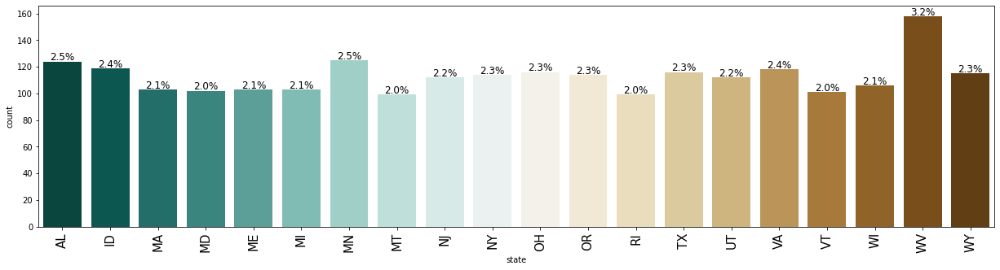

In [15]:
labeled_barplot(df, "state", perc=True, n=20)

#### Observations:
- Percentage of users across states are almost normally distributed at around 2%, with WV having a slightly higher share at 3.2%


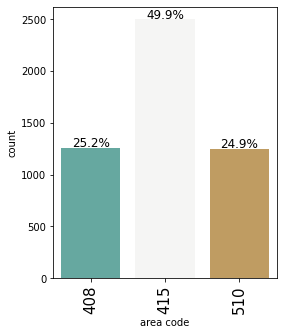

In [16]:
labeled_barplot(df, "area code", perc=True, n=None)

#### Observations:
- The users are spread across 3 different area codes

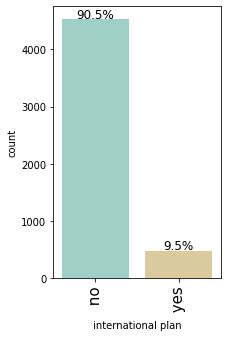

In [17]:
labeled_barplot(df, "international plan", perc=True, n=None)

#### Observations:
- Less than 10% of the customers have an International Plan

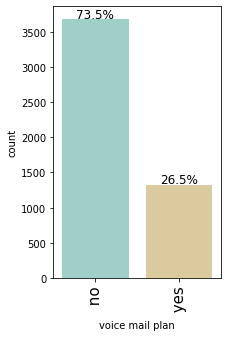

In [18]:
labeled_barplot(df, "voice mail plan", perc=True, n=None)

#### Observations:
- 26% of users have a voice mail plan

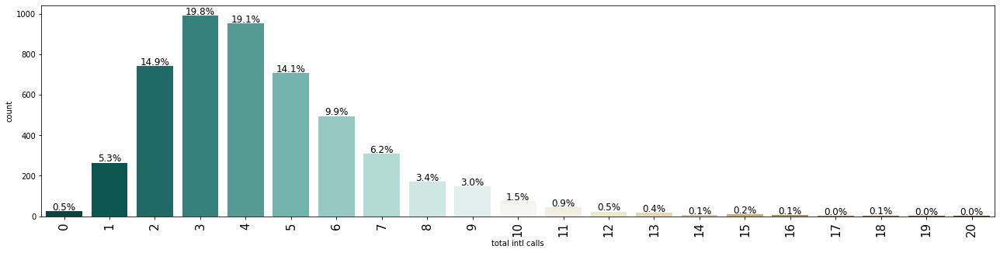

In [19]:
labeled_barplot(df, "total intl calls", perc=True, n=None)

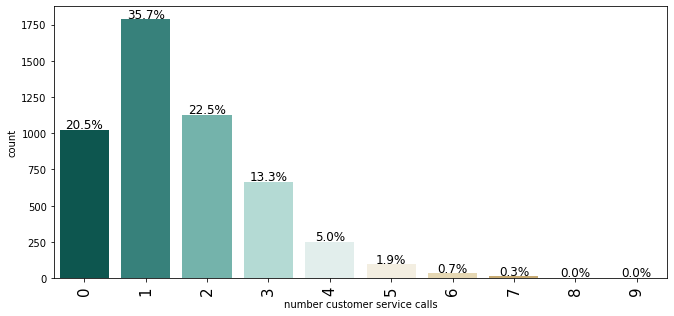

In [20]:
labeled_barplot(df, "number customer service calls", perc=True, n=None)

#### Observations:
- 56% of users made either one or no calls to customer service
- Customer care calls made thrice or more represent customers that may be having unresolved issues

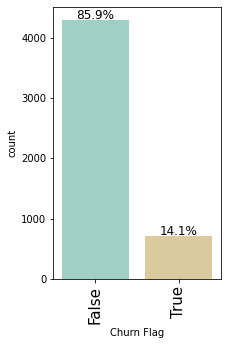

In [21]:
labeled_barplot(df, "Churn Flag", perc=True, n=None)

#### Observations:
- 14% of the customers churnedOf the users in the dataset, 14.1% churned


In [22]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, palette="BrBG"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, facecolor='midnightblue'
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, facecolor='midnightblue'
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="black", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="white", linestyle="-"
    )  # Add median to the histogram




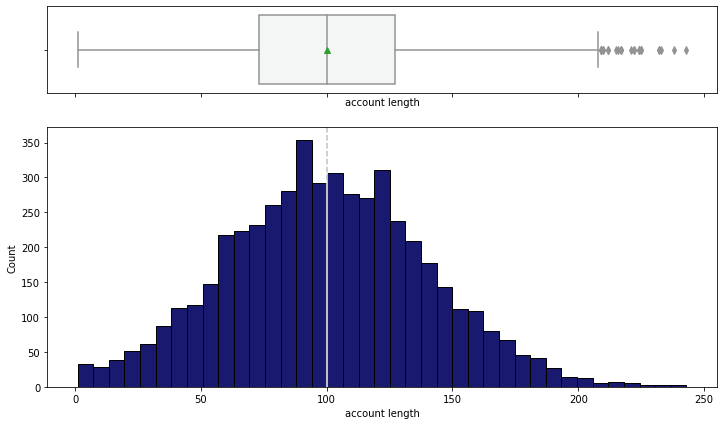

In [23]:
histogram_boxplot(df, "account length", figsize=(12, 7), kde=False, bins=None)

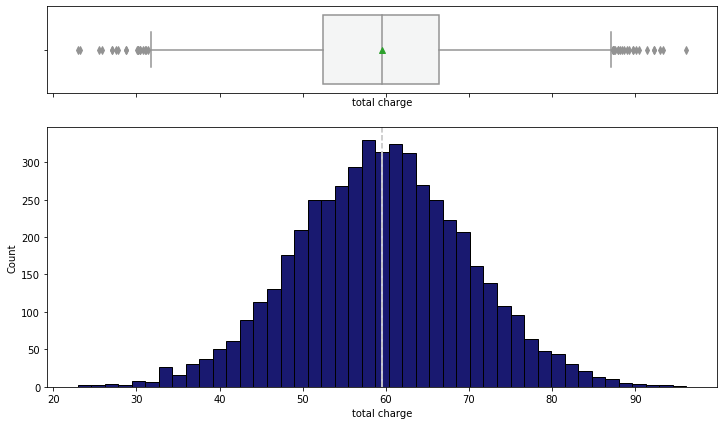

In [24]:
histogram_boxplot(df, "total charge", figsize=(12, 7), kde=False, bins=None)

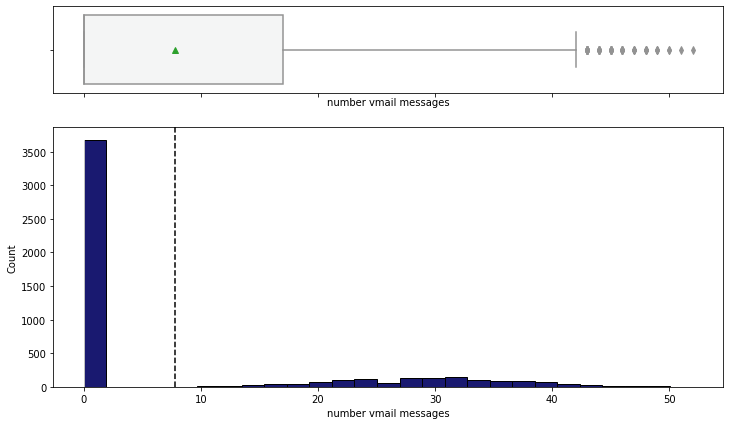

In [25]:
histogram_boxplot(df, "number vmail messages", figsize=(12, 7), kde=False, bins=None)

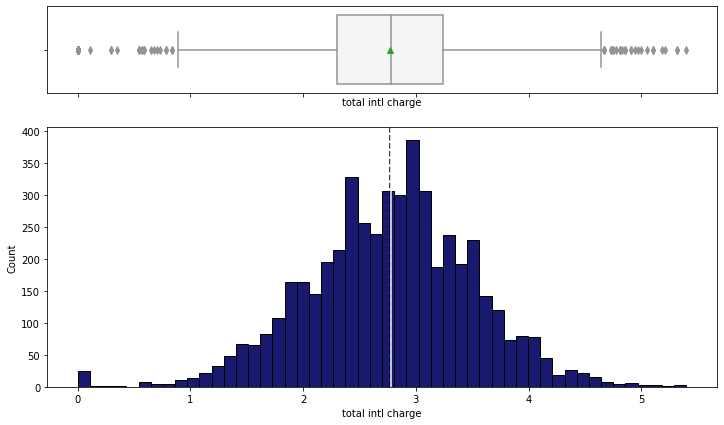

In [26]:
histogram_boxplot(df, "total intl charge", figsize=(12, 7), kde=False, bins=None)

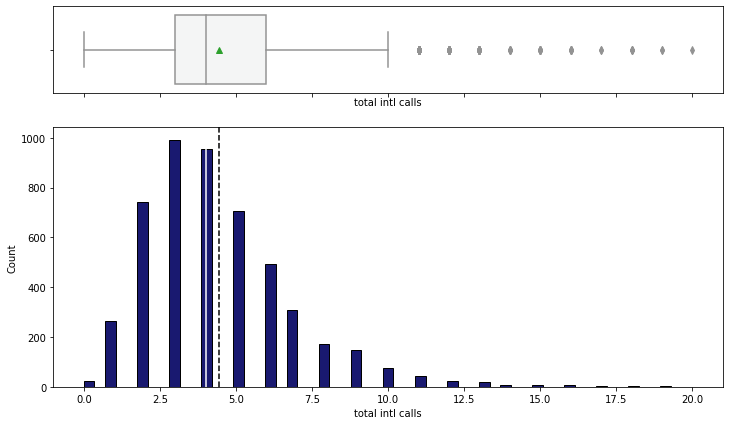

In [27]:
histogram_boxplot(df, "total intl calls", figsize=(12, 7), kde=False, bins=None)

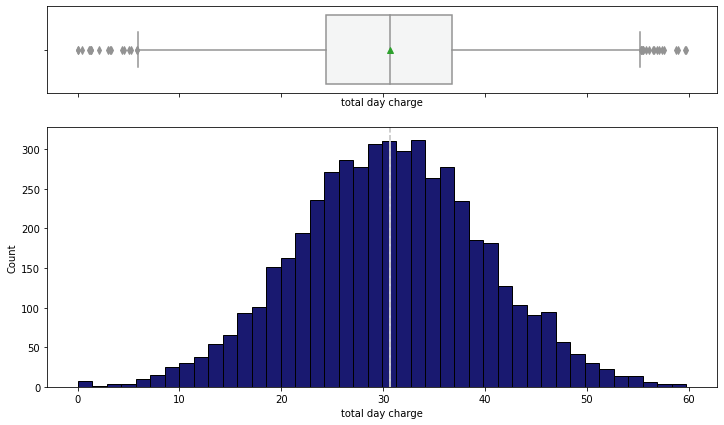

In [28]:
histogram_boxplot(df, "total day charge", figsize=(12, 7), kde=False, bins=None)

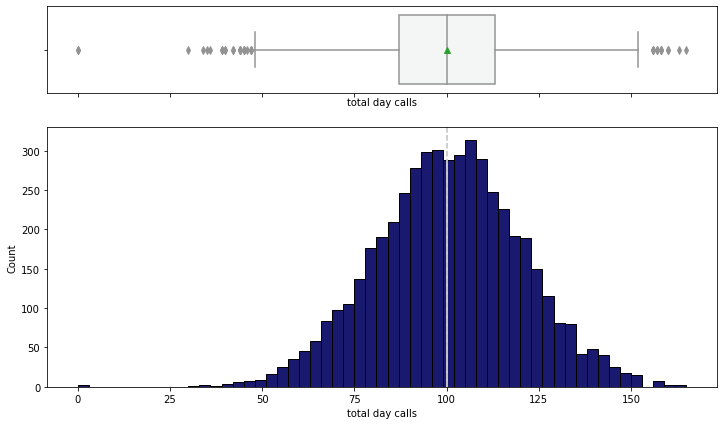

In [29]:
histogram_boxplot(df, "total day calls", figsize=(12, 7), kde=False, bins=None)

#### Observations:
- The distributions for total charge and account lengths are normal.
- Mean account length is 100 days
- The users spent an average of \\$59 in total charges, the least amount is \\$22 and the highest is \\$/96
- Average customer spend on international calls is \\$2.7
- Account length has outliers toward the right side, and total charge has outliers on both sides
- Total International calls has many outliers towards the right.


## Bivariate Analysis

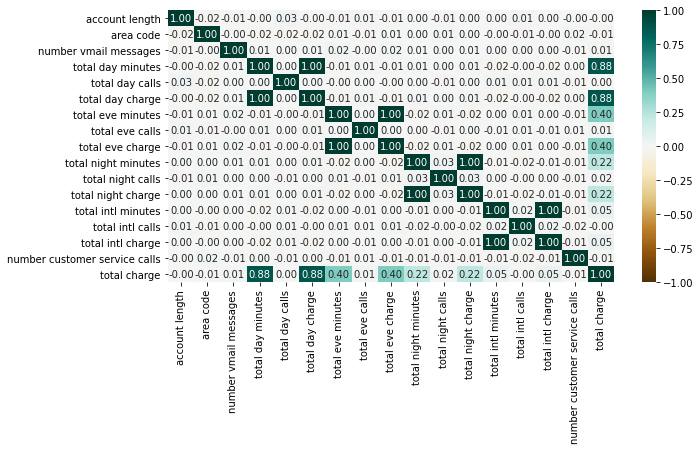

In [30]:
# heatmap of correlation between variables
cols_list = df.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(10, 5))
sns.heatmap(df[cols_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="BrBG")
plt.show()

#### Observations:
- Total day, evening, and night minutes have a correlation coefficient of 1 with their respective Total charge columns.

In [31]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()



Churn Flag  False  True   All
area code                    
All          4293   707  5000
415          2149   346  2495
510          1062   184  1246
408          1082   177  1259
------------------------------------------------------------------------------------------------------------------------


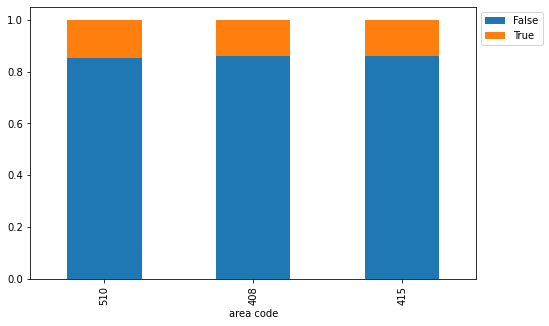

In [32]:
stacked_barplot(df, "area code", "Churn Flag")

#### Observations:
- The churn rate across all area codes is almost the same.

<AxesSubplot:xlabel='total day charge', ylabel='Churn Flag'>

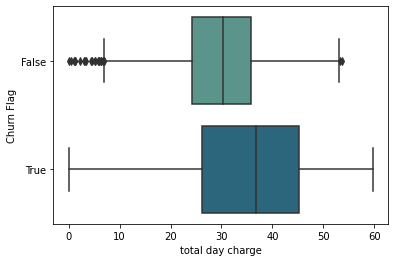

In [33]:
sns.boxplot(x="total day charge", y="Churn Flag", data=df, palette="crest")

Churn Flag          False  True   All
international plan                   
All                  4293   707  5000
 no                  4019   508  4527
 yes                  274   199   473
------------------------------------------------------------------------------------------------------------------------


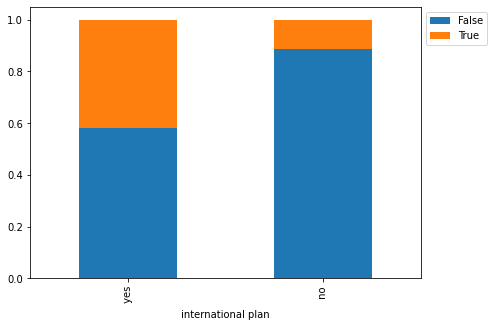

In [34]:
stacked_barplot(df, "international plan", "Churn Flag")

#### Observations:
* Churn rate among customers with an International plan is at around 40%


Churn Flag                     False  True   All
number customer service calls                   
All                             4293   707  5000
1                               1596   190  1786
2                               1005   122  1127
0                                902   121  1023
4                                141   111   252
3                                592    73   665
5                                 38    58    96
6                                 12    22    34
7                                  6     7    13
9                                  0     2     2
8                                  1     1     2
------------------------------------------------------------------------------------------------------------------------


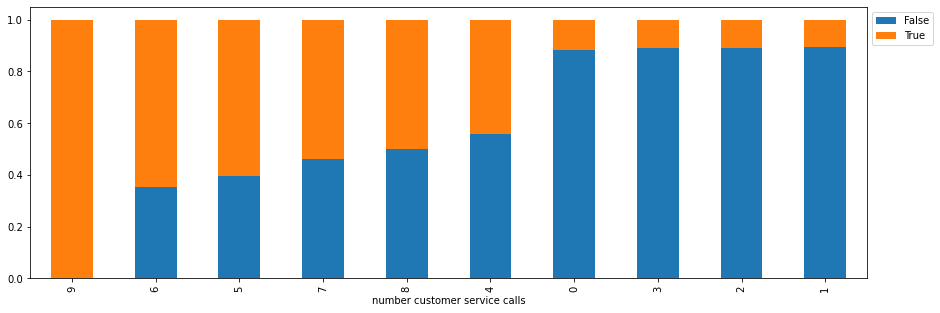

In [35]:
stacked_barplot(df, "number customer service calls", "Churn Flag")

#### Observations:
- The number of customer care calls made appears to be inversely related to the customer staying.
- It is minor among customers who made 0-3 calls
- It starts to increase from 4 calls, and peaks at 9, which is the highest number of calls made

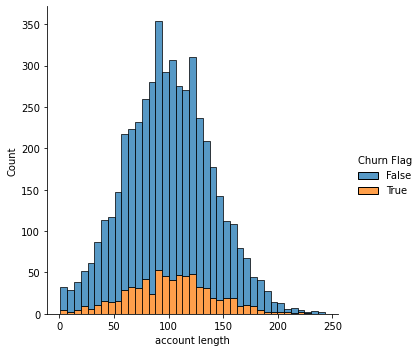

In [36]:
sns.displot(df, x="account length", hue="Churn Flag", multiple="stack")

#### Observations:
The churn rate is significant among customers with account lengths falling between 50 and 150 days, and peaks between 100 and 120.

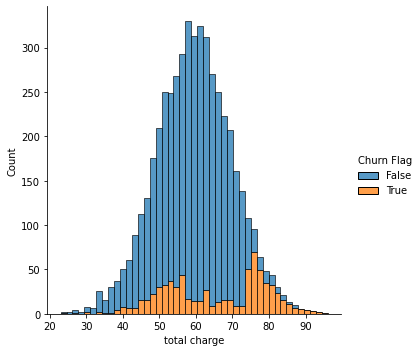

In [37]:
sns.displot(df, x="total charge", hue="Churn Flag", multiple="stack")

#### Observations:
- The churn rate is significant among customers that spent between $45 and $60, and between 70 and 80, after which it declines.
- The churn rate peaks at customers spending around $73


<AxesSubplot:xlabel='account length', ylabel='Churn Flag'>

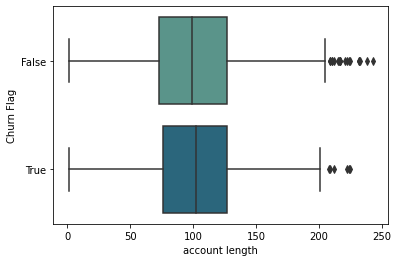

In [38]:
sns.boxplot(x="account length", y="Churn Flag", data=df, palette="crest")


<AxesSubplot:xlabel='total charge', ylabel='Churn Flag'>

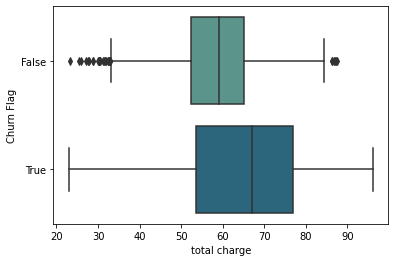

In [39]:
sns.boxplot(x="total charge", y="Churn Flag", data=df, palette="crest")

In [40]:
### function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="green",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="magma")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="magma",
    )

    plt.tight_layout()
    plt.show()

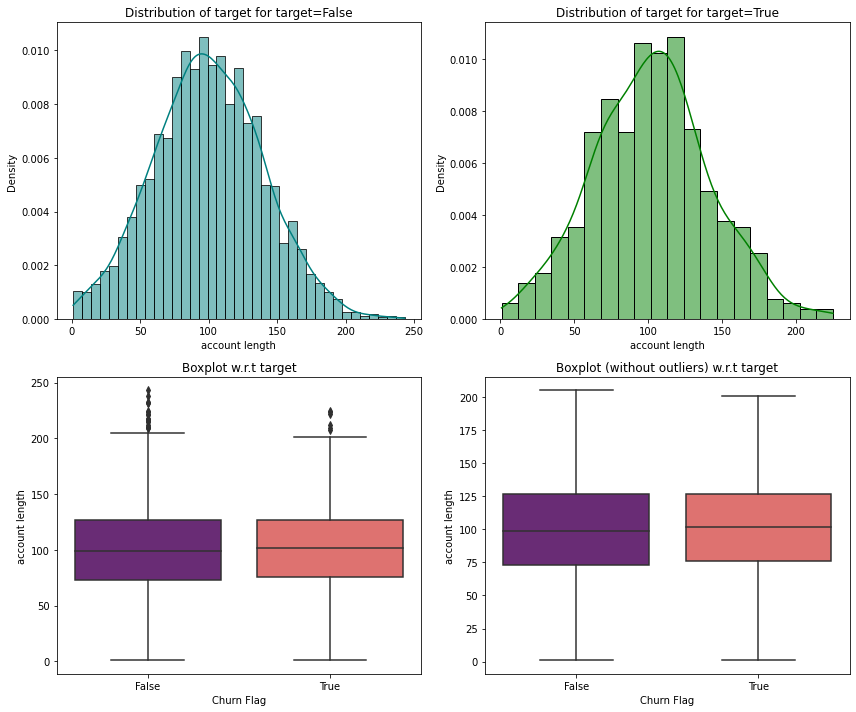

In [41]:
distribution_plot_wrt_target(df, "account length", "Churn Flag")

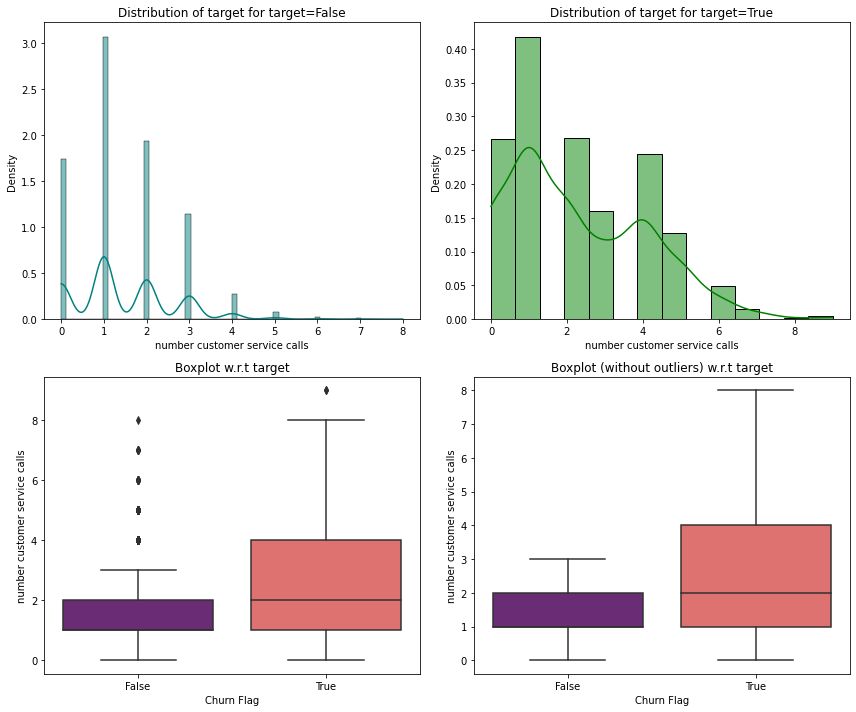

In [42]:
distribution_plot_wrt_target(df, "number customer service calls", "Churn Flag")

# Model Building

### Model evaluation criterion

### Possible errors:

1. Model predicts that the customer will churn, but in reality, the customer stays:  A False Positive.
2. Model predicts that the customer will not churn, but in reality, the customer leaves: A False Negatvive.

### Which case is more important? 
* For us, it is important to prevent the second error

* If a customer is incorrectly predicted to churn, the company might extend an offer to him/her although it may not have been necessary. This wouldn't put significant pressure on the resources, and hence impact is negligible.
* But if the opposite happens, an unsatisfied customer may be left unattended and will churn, and a valuable customer will have been lost


### How to reduce the losses?

* `Recall` can be used a the metric for evaluation of the model, greater the Recall score, higher are the chances of minimizing False Negatives.

# Data Preparation for modeling

In [43]:
# creating a copy for model building
df1 = df.copy()

In [44]:
# encoding target variable
df1["Churn Flag"] = df1["Churn Flag"].apply(lambda x: 1 if x == "True" else 0)

# encoding
df1["international plan"].replace([" no", " yes"], [0, 1], inplace=True)
df1["voice mail plan"].replace([" no", " yes"], [0, 1], inplace=True)

# Label encoding
encoder = LabelEncoder()
coded_state = encoder.fit_transform(df1["state"])
df1["state"] = coded_state

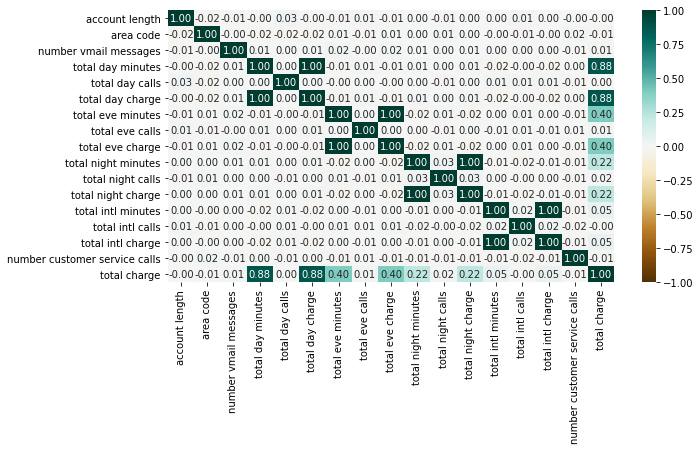

In [45]:
# heatmap of correlation between variables
cols_list = df.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(10, 5))
sns.heatmap(df[cols_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="BrBG")
plt.show()

#### Observations:
- Total day,evening, night and international minutes have a correlation coefficient of 1 with their repective charges columns, so we'll drop those.
##### Correlations with target variable (Churn Flag):
- International Plan has a 0.26 correlation coefficient
- Voice mail Plan has a correlation coefficient of negative 0.11
- Total minutes and charge has a 0.24 p
- Number of customer service calls has a p of 0.24



In [46]:
# Dropping variables with correlation coefficient of 1
df2 = df1.drop(
    [
        "total day minutes",
        "total eve minutes",
        "total night minutes",
        "total intl minutes",
    ],
    axis=1,
)

In [47]:
# checking shape of modified dataframe
df2.shape

(5000, 17)

In [48]:
# dividing data into X and Y
X = df2.drop(["Churn Flag"], axis=1)
Y = df2["Churn Flag"]

In [49]:
X.shape

(5000, 16)

In [50]:
# scaling the data between 0 and 1
X_scaled = RobustScaler().fit_transform(X)
# X_test = minmax_scaling(X_test_init, columns=features)
# X_test

In [51]:
X_scaled

array([[-0.38461538,  0.51851852,  0.        , ..., -0.08510638,
         0.        ,  1.15363881],
       [ 0.34615385,  0.12962963,  0.        , ...,  0.9787234 ,
         0.        , -0.01940701],
       [ 0.19230769,  0.68518519,  0.        , ...,  0.54255319,
        -1.        ,  0.19982031],
       ...,
       [-0.73076923, -0.72222222,  0.        , ...,  0.94680851,
         0.        , -0.55274034],
       [-0.73076923,  0.16666667, 13.57142857, ..., -0.5106383 ,
        -1.        , -0.03018868],
       [ 0.76923077, -0.25925926,  0.        , ..., -0.28723404,
        -1.        , -0.38310872]])

In [52]:
# Splitting data in train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1, stratify=Y
)

In [53]:
X_train

,state,account length,area code,international plan,voice mail plan,number vmail messages,total day calls,total day charge,total eve calls,total eve charge,total night calls,total night charge,total intl calls,total intl charge,number customer service calls,total charge
679,43,75,415,1,0,0,78,37.81000,111,27.80000,104,9.36000,9,2.35000,1,77.32000
2511,35,169,408,0,0,0,115,25.02000,123,13.76000,103,6.39000,6,1.94000,3,47.11000
1933,38,119,408,0,0,0,101,44.22000,68,21.80000,89,10.31000,2,2.70000,1,79.03000
2722,18,98,408,0,0,0,82,23.14000,118,13.29000,83,7.15000,5,2.73000,2,46.31000
3469,49,113,510,0,1,28,93,44.95000,79,18.94000,88,9.62000,4,2.70000,1,76.21000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3737,5,71,415,0,0,0,114,37.01000,105,15.47000,87,5.11000,10,2.30000,4,59.89000
781,49,112,415,1,0,0,138,27.52000,114,17.08000,134,6.03000,4,2.89000,1,53.52000
1541,26,48,415,0,1,36,92,39.25000,121,14.25000,87,12.15000,4,2.05000,3,67.70000
106,22,36,510,0,1,29,102,47.84000,76,17.19000,113,8.42000,6,2.43000,2,75.88000


In [54]:
# Checking shapes
print("X_train=", X_train.shape)
print("y_train=", y_train.shape)
print("X_test=", X_test.shape)
print("y_test=", y_test.shape)

X_train= (3500, 16)
y_train= (3500,)
X_test= (1500, 16)
y_test= (1500,)


In [55]:
def train_recall(ve):
    return recall_score(y_train, ve.predict(X_train))


def test_recall(we):
    return recall_score(y_test, we.predict(X_test))


def train_accuracy(v):
    return accuracy_score(y_train, v.predict(X_train))


def test_accuracy(w):
    return accuracy_score(y_test, w.predict(X_test))


def class_report(c):
    print("Classification_report:", classification_report((y_test, c.predict(X_test))))


def f_score(f):
    return f1_score(y_test, f.predict(X_test))


def f1_w(i):
    labels = [0, 1]
    f = f1_score(y_test, i.predict(X_test), average=None, labels=labels)
    return round(
        ((f[0] * y_test.value_counts()[0]) + (f[1] * y_test.value_counts()[1]))
        / (y_test.value_counts()[0] + y_test.value_counts()[1]),
        4,
    )


score_card = pd.DataFrame(
    columns=[
        "Model_Name",
        "Train_Accuracy",
        "Test_Accuracy",
        "Train_Recall",
        "Test_Recall",
        "f1_weighted_avg",
    ]
)


def update_score_card(algorithm_name, model):

    global score_card

    score_card = score_card.append(
        {
            "Model_Name": algorithm_name,
            "Train_Accuracy": train_accuracy(model),
            "Test_Accuracy": test_accuracy(model),
            "Train_Recall": train_recall(model),
            "Test_Recall": test_recall(model),
            "f1_weighted_avg": f1_w(model),
        },
        ignore_index=True,
    )

In [56]:
def confusion_matrix_sdf(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="", cmap="Blues")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")


def scores(a):
    print("Train_Recall_Score:", round(recall_score(y_train, a.predict(X_train)), 3))
    print("Test_Recall_Score:", round(recall_score(y_test, a.predict(X_test)), 3))
    print(
        "Train_Accuracy_Score:", round(accuracy_score(y_train, a.predict(X_train)), 3)
    )
    print("Test_Accuracy_Score:", round(accuracy_score(y_test, a.predict(X_test)), 3))
    print("Train_F1_Score:", round(f1_score(y_train, a.predict(X_train)), 3))
    print("Test_F1_Score:", round(f1_score(y_test, a.predict(X_test)), 3))
    print("Classification_report:\n", classification_report(y_test, a.predict(X_test)))

    confusion_matrix_sdf(a, X_test, y_test)

# Models

Train_Recall_Score: 0.099
Test_Recall_Score: 0.085
Train_Accuracy_Score: 0.864
Test_Accuracy_Score: 0.861
Train_F1_Score: 0.171
Test_F1_Score: 0.147
Classification_report:
               precision    recall  f1-score   support

           0       0.87      0.99      0.92      1288
           1       0.55      0.08      0.15       212

    accuracy                           0.86      1500
   macro avg       0.71      0.54      0.54      1500
weighted avg       0.82      0.86      0.81      1500

[[0.95964014 0.04035986]
 [0.81784477 0.18215523]
 [0.96732464 0.03267536]
 ...
 [0.67709547 0.32290453]
 [0.97891355 0.02108645]
 [0.92661535 0.07338465]]


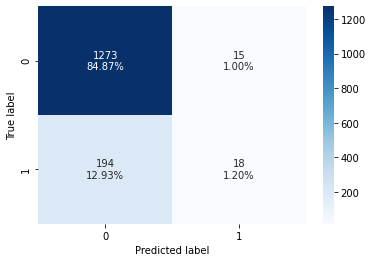

In [57]:

logreg_model = LogisticRegression(random_state=25).fit(X_train, y_train)

# Getting the scores
scores(logreg_model)
update_score_card("LogisticRegression", logreg_model)

# Getting probability scores
probability_scores_logreg_model = logreg_model.predict_proba(X_test)
print(probability_scores_logreg_model)

Train_Recall_Score: 0.232
Test_Recall_Score: 0.123
Train_Accuracy_Score: 0.888
Test_Accuracy_Score: 0.867
Train_F1_Score: 0.37
Test_F1_Score: 0.207
Classification_report:
               precision    recall  f1-score   support

           0       0.87      0.99      0.93      1288
           1       0.67      0.12      0.21       212

    accuracy                           0.87      1500
   macro avg       0.77      0.56      0.57      1500
weighted avg       0.84      0.87      0.83      1500

[[0.6 0.4]
 [0.8 0.2]
 [1.  0. ]
 ...
 [1.  0. ]
 [0.8 0.2]
 [0.8 0.2]]


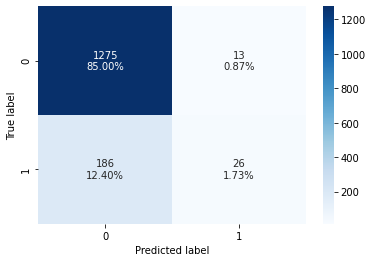

In [58]:
knn_model = KNeighborsClassifier().fit(X_train, y_train)

# Getting the scores
scores(knn_model)
update_score_card("KNeighborsClassifier", knn_model)

# Getting probability scores
probability_scores_knn_model = knn_model.predict_proba(X_test)
print(probability_scores_knn_model)

Train_Recall_Score: 1.0
Test_Recall_Score: 0.821
Train_Accuracy_Score: 1.0
Test_Accuracy_Score: 0.949
Train_F1_Score: 1.0
Test_F1_Score: 0.819
Classification_report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97      1288
           1       0.82      0.82      0.82       212

    accuracy                           0.95      1500
   macro avg       0.89      0.90      0.89      1500
weighted avg       0.95      0.95      0.95      1500

[[1. 0.]
 [1. 0.]
 [1. 0.]
 ...
 [1. 0.]
 [1. 0.]
 [1. 0.]]


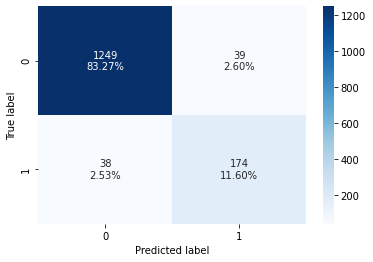

In [59]:
dt_model = DecisionTreeClassifier().fit(X_train, y_train)

# Getting the scores
scores(dt_model)
update_score_card("DecisionTreeClassifier", dt_model)

# Getting probability scores
probability_scores_dt_model = dt_model.predict_proba(X_test)
print(probability_scores_dt_model)

Train_Recall_Score: 1.0
Test_Recall_Score: 0.816
Train_Accuracy_Score: 1.0
Test_Accuracy_Score: 0.973
Train_F1_Score: 1.0
Test_F1_Score: 0.894
Classification_report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98      1288
           1       0.99      0.82      0.89       212

    accuracy                           0.97      1500
   macro avg       0.98      0.91      0.94      1500
weighted avg       0.97      0.97      0.97      1500

[[0.98 0.02]
 [0.94 0.06]
 [1.   0.  ]
 ...
 [0.93 0.07]
 [1.   0.  ]
 [1.   0.  ]]


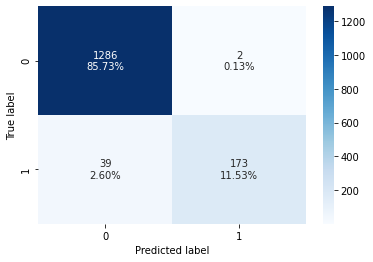

In [60]:
rfc_model = RandomForestClassifier().fit(X_train, y_train)

# Getting the scores
scores(rfc_model)
update_score_card("RandomForestClassifier", rfc_model)

# Getting probability scores
probability_scores_rfc_model = rfc_model.predict_proba(X_test)
print(probability_scores_rfc_model)

Train_Recall_Score: 0.626
Test_Recall_Score: 0.557
Train_Accuracy_Score: 0.932
Test_Accuracy_Score: 0.917
Train_F1_Score: 0.723
Test_F1_Score: 0.654
Classification_report:
               precision    recall  f1-score   support

           0       0.93      0.98      0.95      1288
           1       0.79      0.56      0.65       212

    accuracy                           0.92      1500
   macro avg       0.86      0.77      0.80      1500
weighted avg       0.91      0.92      0.91      1500

[[0.52163831 0.47836169]
 [0.51553463 0.48446537]
 [0.51847017 0.48152983]
 ...
 [0.51940294 0.48059706]
 [0.51161509 0.48838491]
 [0.5167118  0.4832882 ]]


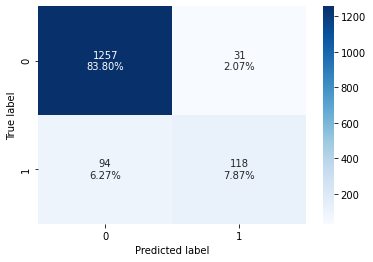

In [61]:
adb_model = AdaBoostClassifier().fit(X_train, y_train)

# Getting the scores
scores(adb_model)
update_score_card("AdaBoostClassifier", adb_model)

# Getting probability scores
probability_scores_adb_model = adb_model.predict_proba(X_test)
print(probability_scores_adb_model)

Train_Recall_Score: 1.0
Test_Recall_Score: 0.821
Train_Accuracy_Score: 1.0
Test_Accuracy_Score: 0.973
Train_F1_Score: 1.0
Test_F1_Score: 0.895
Classification_report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98      1288
           1       0.98      0.82      0.89       212

    accuracy                           0.97      1500
   macro avg       0.98      0.91      0.94      1500
weighted avg       0.97      0.97      0.97      1500

[[9.97564119e-01 2.43588137e-03]
 [9.97508857e-01 2.49114323e-03]
 [9.99262449e-01 7.37550566e-04]
 ...
 [9.95185586e-01 4.81441387e-03]
 [9.98983729e-01 1.01627139e-03]
 [9.99534571e-01 4.65428895e-04]]


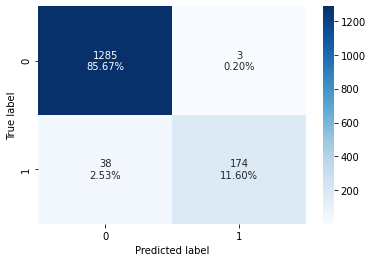

In [62]:
LGB_model = lgb.LGBMClassifier().fit(X_train, y_train)

# Getting the scores
scores(LGB_model)
update_score_card("LightGBMClassifier", LGB_model)

probability_scores_LGB_model = LGB_model.predict_proba(X_test)
print(probability_scores_LGB_model)

# Comparing Model Performances

In [63]:
score_card

,Model_Name,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,f1_weighted_avg
0,LogisticRegression,0.86429,0.86067,0.09899,0.08491,0.81430
1,KNeighborsClassifier,0.88829,0.86733,0.23232,0.12264,0.82580
2,DecisionTreeClassifier,1.00000,0.94867,1.00000,0.82075,0.94870
3,RandomForestClassifier,1.00000,0.97267,1.00000,0.81604,0.97160
4,AdaBoostClassifier,0.93229,0.91667,0.62626,0.55660,0.91040
5,LightGBMClassifier,1.00000,0.97267,1.00000,0.82075,0.97160


#### Models selected for tuning:
- DecisionTree Classifier
- LightGBM Classifier

# Model Tuning

### Tuning Decision Tree Classifier

Train_Recall_Score: 0.875
Test_Recall_Score: 0.825
Train_Accuracy_Score: 0.909
Test_Accuracy_Score: 0.91
Train_F1_Score: 0.732
Test_F1_Score: 0.722
Classification_report:
               precision    recall  f1-score   support

           0       0.97      0.92      0.95      1288
           1       0.64      0.83      0.72       212

    accuracy                           0.91      1500
   macro avg       0.81      0.87      0.83      1500
weighted avg       0.92      0.91      0.91      1500

[[0.88503069 0.11496931]
 [0.88503069 0.11496931]
 [0.88503069 0.11496931]
 ...
 [0.88503069 0.11496931]
 [0.88503069 0.11496931]
 [0.88503069 0.11496931]]


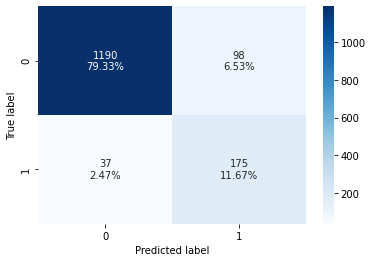

In [64]:
dtree_tuned = DecisionTreeClassifier(class_weight="balanced", random_state=1)

# Grid of parameters
parameters = {
    "max_depth": np.arange(10, 30, 5),
    "min_samples_leaf": [3, 5, 7],
    "max_leaf_nodes": [2, 3, 5],
    "min_impurity_decrease": [0.0001, 0.001],
}
# Type of scoring to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_tuned, parameters, scoring=scorer, n_jobs=-1)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dtree_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
dtree_tuned.fit(X_train, y_train)

# Getting the scores
scores(dtree_tuned)
update_score_card("DecisionTreeClassifier-Tuned", dtree_tuned)

# Getting probability scores
probability_scores_dtree_tuned = dtree_tuned.predict_proba(X_test)
print(probability_scores_dtree_tuned)

### Tuning LightGBM

Train_Recall_Score: 1.0
Test_Recall_Score: 0.825
Train_Accuracy_Score: 1.0
Test_Accuracy_Score: 0.973
Train_F1_Score: 1.0
Test_F1_Score: 0.897
Classification_report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98      1288
           1       0.98      0.83      0.90       212

    accuracy                           0.97      1500
   macro avg       0.98      0.91      0.94      1500
weighted avg       0.97      0.97      0.97      1500

[[9.86446174e-01 1.35538256e-02]
 [9.93294084e-01 6.70591608e-03]
 [9.99762267e-01 2.37733390e-04]
 ...
 [9.98242859e-01 1.75714146e-03]
 [9.97585750e-01 2.41424956e-03]
 [9.99868300e-01 1.31699633e-04]]


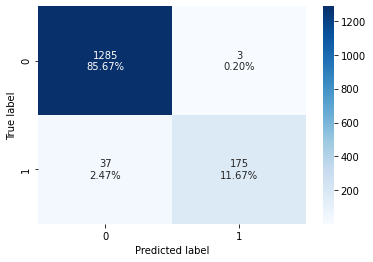

In [65]:
LGB_tuned = lgb.LGBMClassifier(
    boosting_type="gbdt",
    num_leaves=128,
    class_weight="balanced",
    min_child_samples=38,
    importance_type="split",
).fit(X_train, y_train)

# Getting the scores
scores(LGB_tuned)
update_score_card("LGB-Tuned", LGB_tuned)

# Getting probability scores
probability_scores_LGB_tuned = LGB_tuned.predict_proba(X_test)
print(probability_scores_LGB_tuned)

In [66]:
score_card

,Model_Name,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,f1_weighted_avg
0,LogisticRegression,0.86429,0.86067,0.09899,0.08491,0.81430
1,KNeighborsClassifier,0.88829,0.86733,0.23232,0.12264,0.82580
2,DecisionTreeClassifier,1.00000,0.94867,1.00000,0.82075,0.94870
3,RandomForestClassifier,1.00000,0.97267,1.00000,0.81604,0.97160
4,AdaBoostClassifier,0.93229,0.91667,0.62626,0.55660,0.91040
5,LightGBMClassifier,1.00000,0.97267,1.00000,0.82075,0.97160
6,DecisionTreeClassifier-Tuned,0.90943,0.91000,0.87475,0.82547,0.91460
7,LGB-Tuned,1.00000,0.97333,1.00000,0.82547,0.97230


#### Finding the best parameters to tune LightGBM using Optuna

In [67]:
def objective(trial):
    X_train, X_test, y_train, y_test
    # = train_test_split(X, y, test_size=0.25)
    dtrain = lgb.Dataset(X_train, label=y_train)

    param = {
        "objective": "binary",
        "verbosity": -1,
        "boosting_type": "gbdt",
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
    }

    gbm = lgb.train(param, dtrain)
    preds = gbm.predict(X_test)
    pred_labels = np.rint(preds)
    recall = sklearn.metrics.recall_score(y_test, pred_labels)
    return recall

In [68]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

[I 2022-05-08 19:40:49,740] A new study created in memory with name: no-name-51b17af8-2367-419f-bc98-9475f9ea9df5
[I 2022-05-08 19:40:50,105] Trial 0 finished with value: 0.7594339622641509 and parameters: {'lambda_l1': 7.997848968768984, 'lambda_l2': 7.281831254023416e-06, 'num_leaves': 60, 'feature_fraction': 0.6372367742285847, 'bagging_fraction': 0.5558580624423279, 'bagging_freq': 5, 'min_child_samples': 69}. Best is trial 0 with value: 0.7594339622641509.
[I 2022-05-08 19:40:50,297] Trial 1 finished with value: 0.75 and parameters: {'lambda_l1': 0.03351731190752351, 'lambda_l2': 0.08339107073451216, 'num_leaves': 24, 'feature_fraction': 0.4127577797946129, 'bagging_fraction': 0.5552540160108783, 'bagging_freq': 1, 'min_child_samples': 57}. Best is trial 0 with value: 0.7594339622641509.
[I 2022-05-08 19:40:51,111] Trial 2 finished with value: 0.8160377358490566 and parameters: {'lambda_l1': 0.03696662585403516, 'lambda_l2': 0.013713613334814884, 'num_leaves': 236, 'feature_fracti

[I 2022-05-08 19:41:01,566] Trial 22 finished with value: 0.8207547169811321 and parameters: {'lambda_l1': 0.0029988462995494255, 'lambda_l2': 0.04042871072169433, 'num_leaves': 96, 'feature_fraction': 0.8557483899676978, 'bagging_fraction': 0.9901336471247194, 'bagging_freq': 3, 'min_child_samples': 23}. Best is trial 8 with value: 0.8254716981132075.
[I 2022-05-08 19:41:02,171] Trial 23 finished with value: 0.8160377358490566 and parameters: {'lambda_l1': 4.259487562176968e-06, 'lambda_l2': 6.783279597427106e-05, 'num_leaves': 201, 'feature_fraction': 0.7443682060371422, 'bagging_fraction': 0.9073039923517887, 'bagging_freq': 1, 'min_child_samples': 29}. Best is trial 8 with value: 0.8254716981132075.
[I 2022-05-08 19:41:02,453] Trial 24 finished with value: 0.8207547169811321 and parameters: {'lambda_l1': 0.12205711496910565, 'lambda_l2': 0.00071331686057608, 'num_leaves': 117, 'feature_fraction': 0.6307656319570136, 'bagging_fraction': 0.9420902040105823, 'bagging_freq': 4, 'min_ch

[I 2022-05-08 19:41:10,482] Trial 45 finished with value: 0.8254716981132075 and parameters: {'lambda_l1': 0.15841613036438995, 'lambda_l2': 1.408317738200824, 'num_leaves': 252, 'feature_fraction': 0.5062829671522527, 'bagging_fraction': 0.7285330819210313, 'bagging_freq': 7, 'min_child_samples': 50}. Best is trial 8 with value: 0.8254716981132075.
[I 2022-05-08 19:41:10,649] Trial 46 finished with value: 0.8018867924528302 and parameters: {'lambda_l1': 0.612044506729405, 'lambda_l2': 9.44038372831248, 'num_leaves': 228, 'feature_fraction': 0.5884744511474487, 'bagging_fraction': 0.6580031518668519, 'bagging_freq': 7, 'min_child_samples': 70}. Best is trial 8 with value: 0.8254716981132075.
[I 2022-05-08 19:41:10,899] Trial 47 finished with value: 0.8113207547169812 and parameters: {'lambda_l1': 4.671222408719356e-08, 'lambda_l2': 4.965514377113562e-07, 'num_leaves': 37, 'feature_fraction': 0.4093234963929964, 'bagging_fraction': 0.8641401877694772, 'bagging_freq': 5, 'min_child_sampl

[I 2022-05-08 19:41:16,402] Trial 68 finished with value: 0.7688679245283019 and parameters: {'lambda_l1': 3.9708914260592723, 'lambda_l2': 0.004478394726115106, 'num_leaves': 196, 'feature_fraction': 0.6073992307278663, 'bagging_fraction': 0.6724097350156699, 'bagging_freq': 7, 'min_child_samples': 100}. Best is trial 8 with value: 0.8254716981132075.
[I 2022-05-08 19:41:16,790] Trial 69 finished with value: 0.8160377358490566 and parameters: {'lambda_l1': 0.0060454628389897055, 'lambda_l2': 1.7749374931663226e-05, 'num_leaves': 218, 'feature_fraction': 0.8568954189236466, 'bagging_fraction': 0.9336206978575531, 'bagging_freq': 7, 'min_child_samples': 33}. Best is trial 8 with value: 0.8254716981132075.
[I 2022-05-08 19:41:16,965] Trial 70 finished with value: 0.7783018867924528 and parameters: {'lambda_l1': 4.589594889345511, 'lambda_l2': 3.189193557938069, 'num_leaves': 184, 'feature_fraction': 0.5518961598083716, 'bagging_fraction': 0.6057294177991117, 'bagging_freq': 2, 'min_child

[I 2022-05-08 19:41:22,213] Trial 91 finished with value: 0.8254716981132075 and parameters: {'lambda_l1': 0.0017244062542579764, 'lambda_l2': 4.6942386014679105, 'num_leaves': 249, 'feature_fraction': 0.6210197213958563, 'bagging_fraction': 0.6683364712775857, 'bagging_freq': 7, 'min_child_samples': 48}. Best is trial 8 with value: 0.8254716981132075.
[I 2022-05-08 19:41:22,434] Trial 92 finished with value: 0.8113207547169812 and parameters: {'lambda_l1': 0.07724227345223014, 'lambda_l2': 4.884303219771896, 'num_leaves': 256, 'feature_fraction': 0.5205232232690468, 'bagging_fraction': 0.7520140734719806, 'bagging_freq': 3, 'min_child_samples': 62}. Best is trial 8 with value: 0.8254716981132075.
[I 2022-05-08 19:41:22,587] Trial 93 finished with value: 0.8018867924528302 and parameters: {'lambda_l1': 1.326403231742223, 'lambda_l2': 3.878955078381638, 'num_leaves': 93, 'feature_fraction': 0.46881734214682025, 'bagging_fraction': 0.8236046835733529, 'bagging_freq': 5, 'min_child_sample

In [69]:
print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

Number of finished trials: 100
Best trial:
  Value: 0.8254716981132075
  Params: 
    lambda_l1: 0.016840103795541246
    lambda_l2: 0.002363969325242679
    num_leaves: 111
    feature_fraction: 0.6806646834461072
    bagging_fraction: 0.7039269190351911
    bagging_freq: 2
    min_child_samples: 36


#### Tuning LightGBM using the suggested parameters

[LightGBM] [Warning] bagging_fraction is set=0.9130552028137798, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9130552028137798
[LightGBM] [Warning] feature_fraction is set=0.8764512783052837, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8764512783052837
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] lambda_l2 is set=2.201288025144258e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.201288025144258e-06
[LightGBM] [Warning] lambda_l1 is set=1.2903804436192665e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2903804436192665e-06
Train_Recall_Score: 1.0
Test_Recall_Score: 0.825
Train_Accuracy_Score: 1.0
Test_Accuracy_Score: 0.973
Train_F1_Score: 1.0
Test_F1_Score: 0.895
Classification_report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98      1288
           1       0.98      0.83 

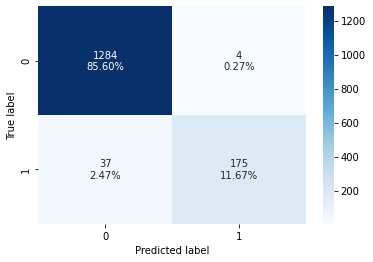

In [70]:
LGB_tuned_optuna = lgb.LGBMClassifier(
    boosting_type="gbdt",
    num_leaves=128,
    max_depth=-1,
    learning_rate=0.1,
    n_estimators=100,
    subsample_for_bin=200000,
    objective="binary",
    class_weight="balanced",
    min_split_gain=0.0,
    min_child_weight=0.001,
    min_child_samples=38,
    feature_fraction=(0.8764512783052837),
    bagging_fraction=(0.9130552028137798),
    bagging_freq=(2),
    lambda_l1=(1.2903804436192665e-06),
    lambda_l2=(2.201288025144258e-06),
    random_state=None,
    n_jobs=-1,
    silent=True,
    importance_type="split",
).fit(X_train, y_train)

# Getting the scores
scores(LGB_tuned_optuna)
update_score_card("LIghtGBM_Tuned-Optuna", LGB_tuned_optuna)

# Getting probability scores
probability_scores_LGB_tuned_optuna = LGB_tuned_optuna.predict_proba(X_test)
print(probability_scores_LGB_tuned_optuna)

# Comparing Tuned-Model Performances

In [71]:
score_card

,Model_Name,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,f1_weighted_avg
0,LogisticRegression,0.86429,0.86067,0.09899,0.08491,0.81430
1,KNeighborsClassifier,0.88829,0.86733,0.23232,0.12264,0.82580
2,DecisionTreeClassifier,1.00000,0.94867,1.00000,0.82075,0.94870
3,RandomForestClassifier,1.00000,0.97267,1.00000,0.81604,0.97160
4,AdaBoostClassifier,0.93229,0.91667,0.62626,0.55660,0.91040
5,LightGBMClassifier,1.00000,0.97267,1.00000,0.82075,0.97160
6,DecisionTreeClassifier-Tuned,0.90943,0.91000,0.87475,0.82547,0.91460
7,LGB-Tuned,1.00000,0.97333,1.00000,0.82547,0.97230
8,LIghtGBM_Tuned-Optuna,1.00000,0.97267,1.00000,0.82547,0.97170


#### Of all the models built, LightGBM gives the best Train and Test Recall score, with the highest F1 weighted average.

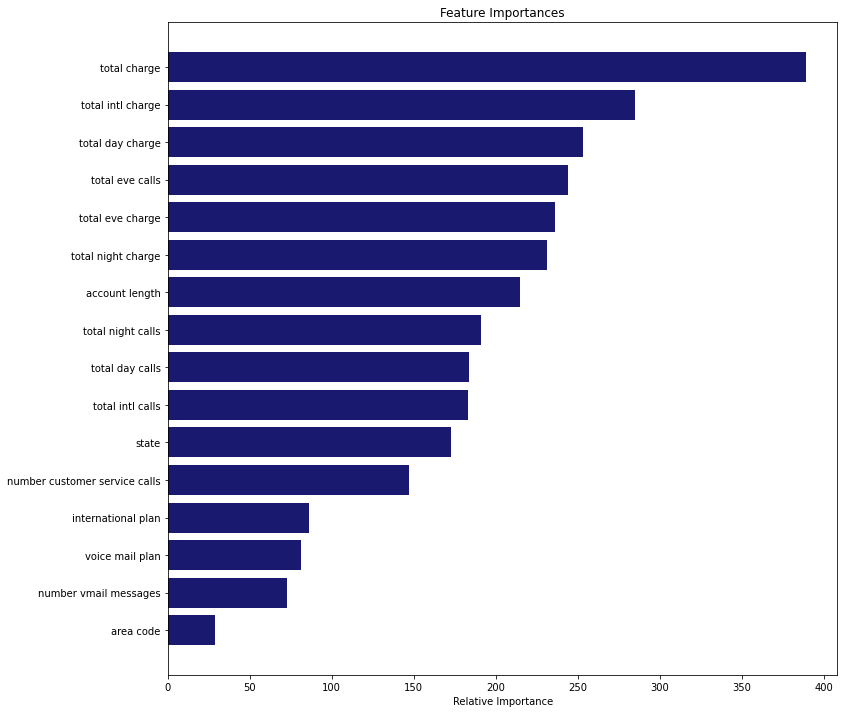

In [72]:
# Plotting feature importances for selected model
feature_names = X_train.columns
importances = LGB_model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(
    range(len(indices)), importances[indices], color="midnightblue", align="center"
)
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

# Feature Importances
- Total charge has the highest importance, followed by a breakdown of the same into international and day.
- This is followed closely by evening calls and charge, and night charge.
- These comprise the top 6 important factors.
- This is then followed by account length.
- Voice mail plan and usage seems to have very little importance in determining if a customer will churn.
- Presence of international plan also seems to have very little importance in determining churn probability
- The least importance was shown by area code of the users


# Business Insights
- The average account length is 100 days, which is just 37% of the 9-month period of the dataset
- Customers that made 4 or more calls to customer service were much likely to churn than those who made 3 calls or less.
- The most calls made to customer care by a customer was 9, and such customers had a 100% churn rate.
- The churn rate is significant among customers with account lengths falling between 50 and 150 days, and peaks between 100 and 120.
 - This means that customers are likely to switch between 2 months of usage and 5 months
 - This could be because the first set of customers were unsatisfied after one month of the service, and just waited to leave before their next billing cycle.
 - Highest churn is in customers of between 3 and 4 months. This needs to be investigated, as to what factors are causing this.
- Total charge:
  - The churn rate is significant among customers that spent between \\$45 and \\$60, and between \\$70 and \\$80, after which it declines.
 - The churn rate is highest among customers spending around \\$73.
  - This insight needs to be investigated further, it could be that these customers are holding a particular plan which costs around $70,  and this particular plan might be causing some issues that most unsatisfied customers are facing.


# Business Recommendations
- Customers making 3 calls or more to Customer Service should be flagged as important and these cases should be tracked for immediate resolution of their issues.
- As customers are most likely to switch between 2-5 months of usage, this signifies that the first 5 months is the important stage where the brand loyalty needs to be established
- Highest churn rate is found in customers of between 3 and 4 months. This needs to be investigated, as to what factors are causing this.
- The churn rate is highest among customers spending around \\$73.
- This insight needs to be investigated further, as it could be that these customers are holding a particular plan which costs \\$73,  and this particular plan might be having some issues that most unsatisfied customers are facing.
- A system needs to be brought in place to record the customer satisfaction after each call made to customer care. - This will not only help improve resolution efficacy, but also help better predict churn probability of any account